CODSOFT Machine Learning Internship

Name: Aditya J

Task 1 - Movie Genre Classification

The dataset is available at Kaggle :
https://www.kaggle.com/datasets/hijest/genre-classification-dataset-imdb

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from wordcloud import WordCloud

In [28]:
train_data = pd.read_csv('train_data.txt', sep=':::', names=['Id', 'Title', 'Genre', 'Description'], engine='python')
test_data = pd.read_csv('test_data.txt', sep=':::', names=['Id', 'Title', 'Description'], engine='python')
test_solution = pd.read_csv('test_data_solution.txt', sep=':::', names=['Id', 'Title', 'Genre', 'Description'], engine='python')

test_results = pd.merge(test_data, test_solution, on='Id')

print(test_results.head())


   Id                        Title_x  \
0   1          Edgar's Lunch (1998)    
1   2      La guerra de papá (1977)    
2   3   Off the Beaten Track (2010)    
3   4        Meu Amigo Hindu (2015)    
4   5             Er nu zhai (1955)    

                                       Description_x  \
0   L.R. Brane loves his life - his car, his apar...   
1   Spain, March 1964: Quico is a very naughty ch...   
2   One year in the life of Albin and his family ...   
3   His father has died, he hasn't spoken with hi...   
4   Before he was known internationally as a mart...   

                         Title_y          Genre  \
0          Edgar's Lunch (1998)       thriller    
1      La guerra de papá (1977)         comedy    
2   Off the Beaten Track (2010)    documentary    
3        Meu Amigo Hindu (2015)          drama    
4             Er nu zhai (1955)          drama    

                                       Description_y  
0   L.R. Brane loves his life - his car, his apar...  
1   S

Visualizing the count of 'genre' column from the dataset

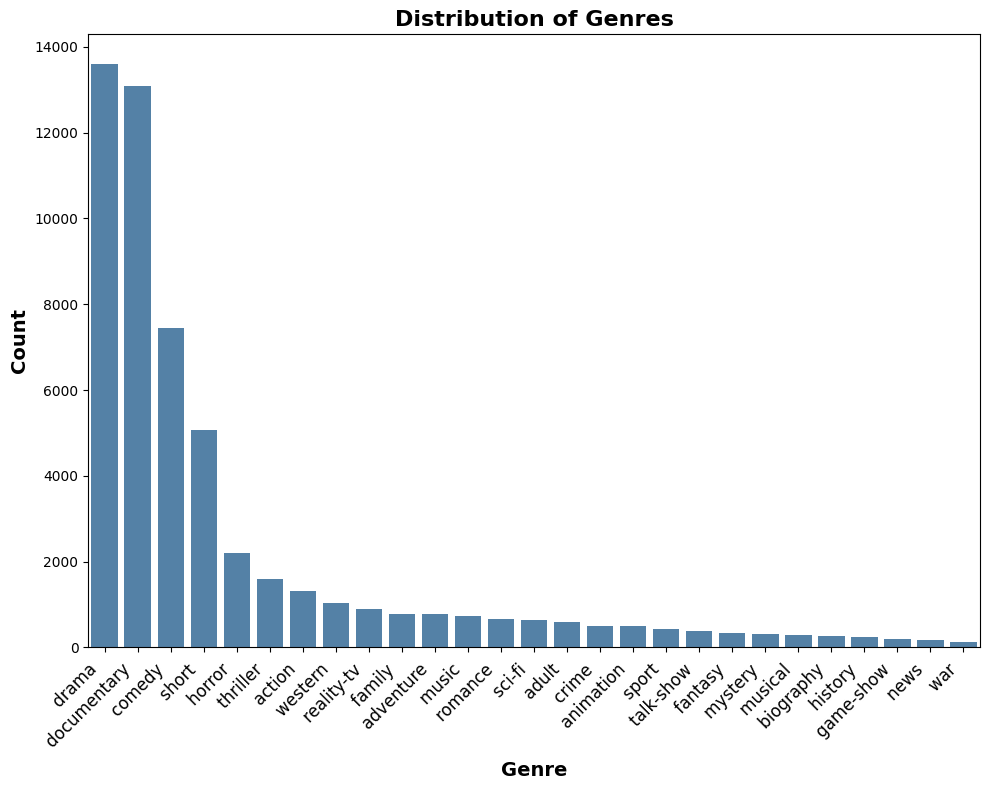

In [29]:
plt.figure(figsize=(10, 8))
sns.countplot(data=train_data, x='Genre', order=train_data['Genre'].value_counts().index, color='steelblue')
plt.ylabel('Count', fontsize=14, fontweight='bold')
plt.xlabel('Genre', fontsize=14, fontweight='bold')
plt.title('Distribution of Genres', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.tight_layout()
plt.show()


Data Cleaning and Preprocessing

In [30]:
stemmer = LancasterStemmer()
stop_words = set(stopwords.words('english'))

def clean_text(text):
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'pic.\S+', '', text)
    text = re.sub(r"[^a-zA-Z+']", ' ', text)
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text + ' ')
    text = "".join([i for i in text if i not in string.punctuation])
    words = nltk.word_tokenize(text)
    stopwords = nltk.corpus.stopwords.words('english')
    text = " ".join([i for i in words if i not in stopwords and len(i) > 2])
    text = re.sub("\s[\s]+", " ", text).strip()
    return text

train_data['Text_cleaning'] = train_data['Description'].apply(clean_text)
test_data['Text_cleaning'] = test_data['Description'].apply(clean_text)

Text Vectorization Using TF-ID and Split Data to Train Models

In [31]:
tfidf_vectorizer = TfidfVectorizer()
X_train = tfidf_vectorizer.fit_transform(train_data['Text_cleaning'])
X_test = tfidf_vectorizer.transform(test_data['Text_cleaning'])

X = X_train
y = train_data['Genre']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

Training and Predicting using Logistic Regression

In [32]:
logreg_classifier = LogisticRegression(max_iter=1000)
logreg_classifier.fit(X_train, y_train)
y_pred_logreg = logreg_classifier.predict(X_test)

Training and Predicting using Naieve Bayes 

In [34]:
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)
y_pred_nb = nb_classifier.predict(X_test)

Creating Word Cloud For Every Genre

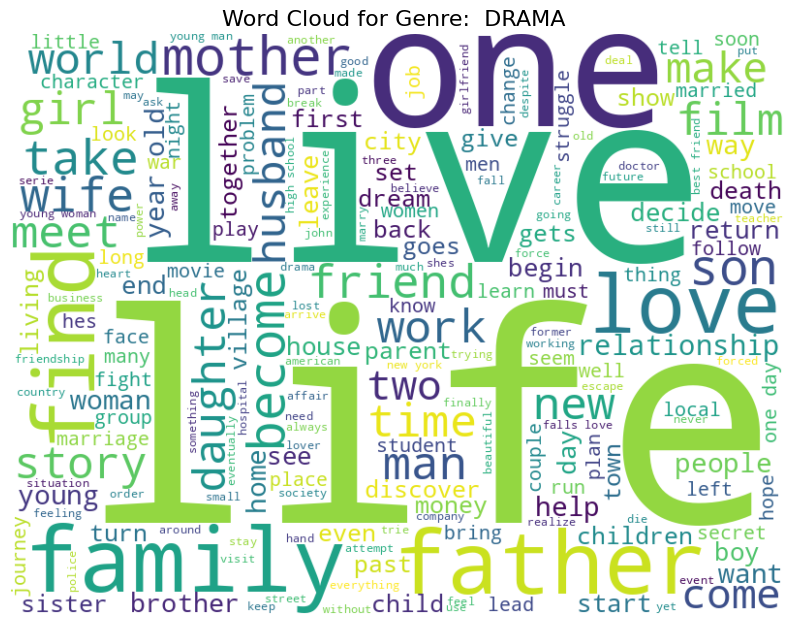

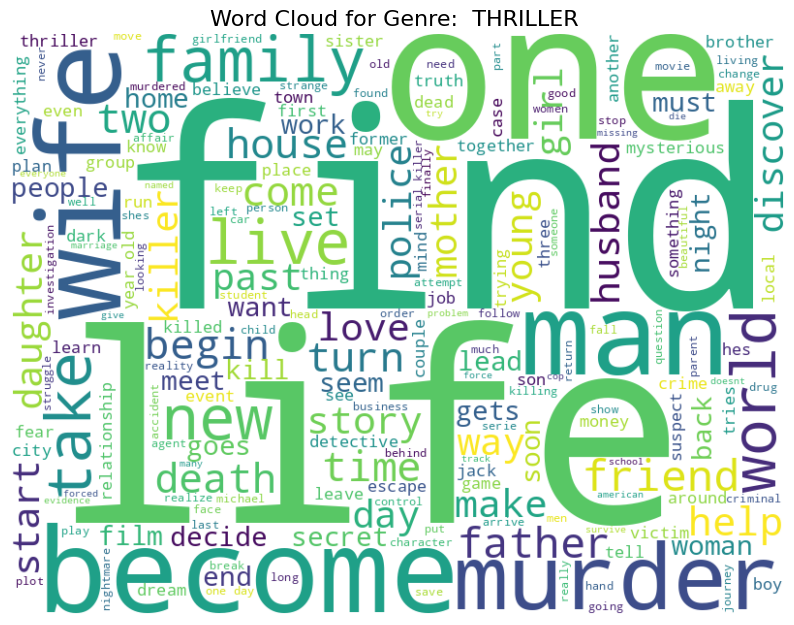

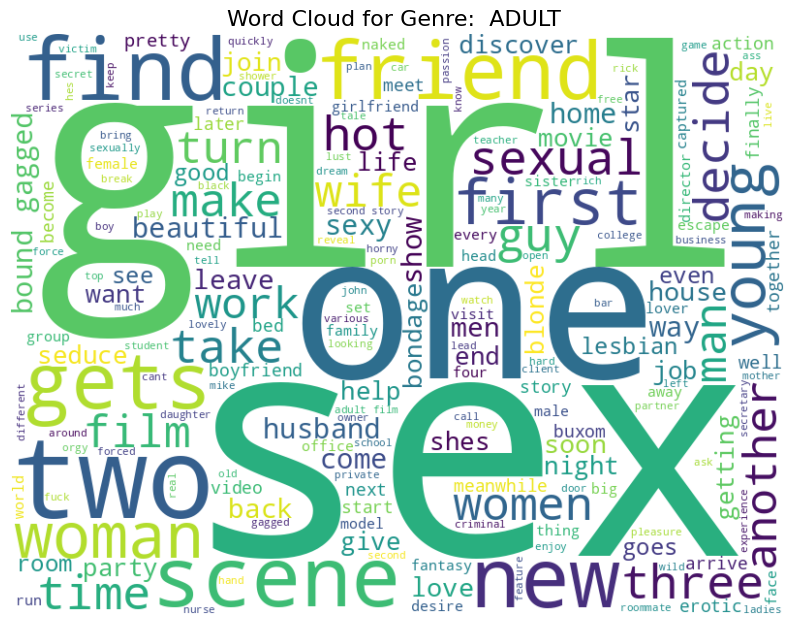

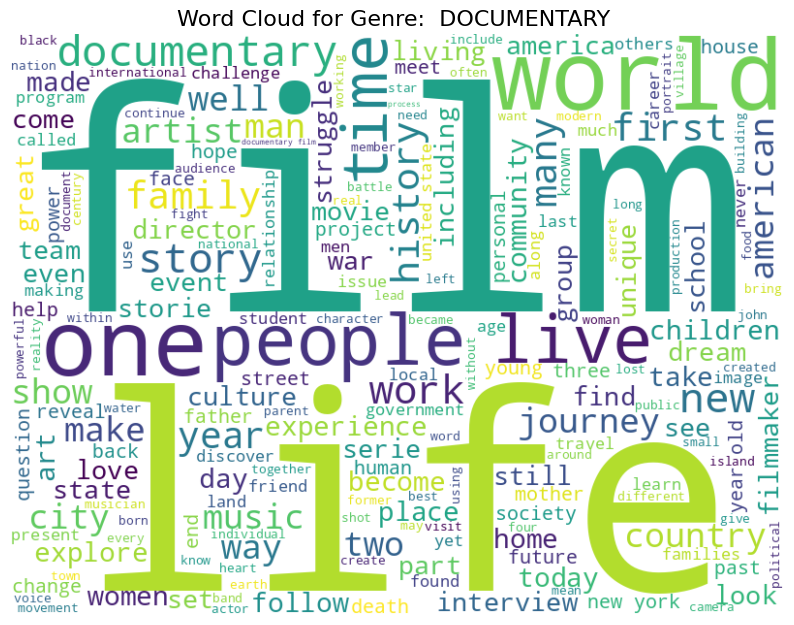

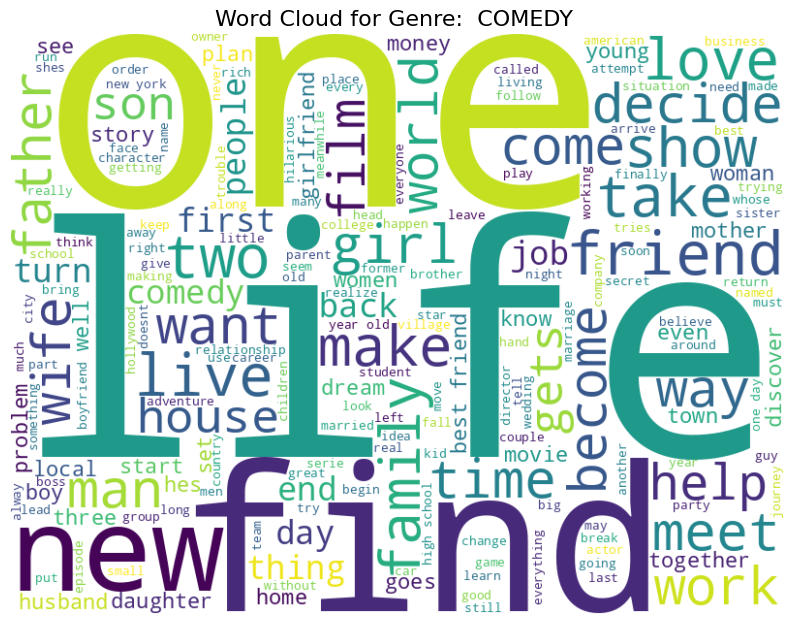

...

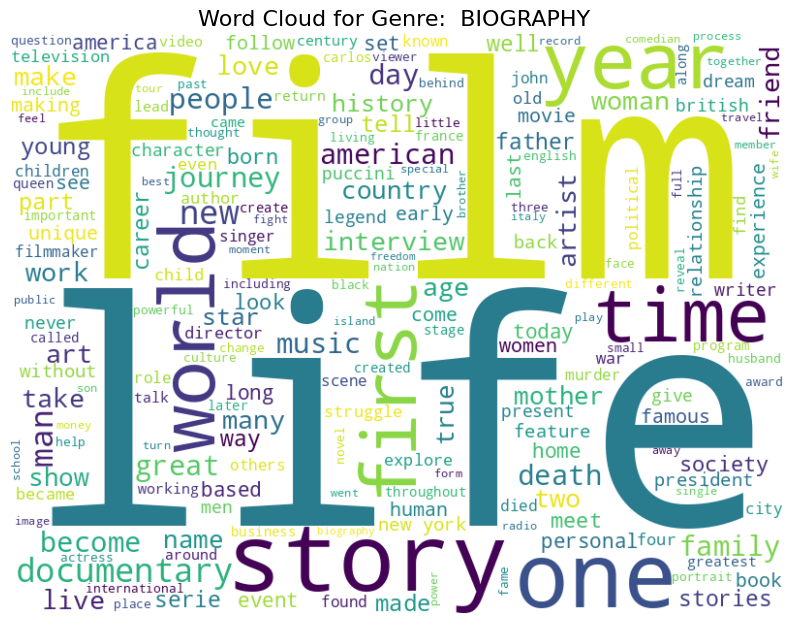

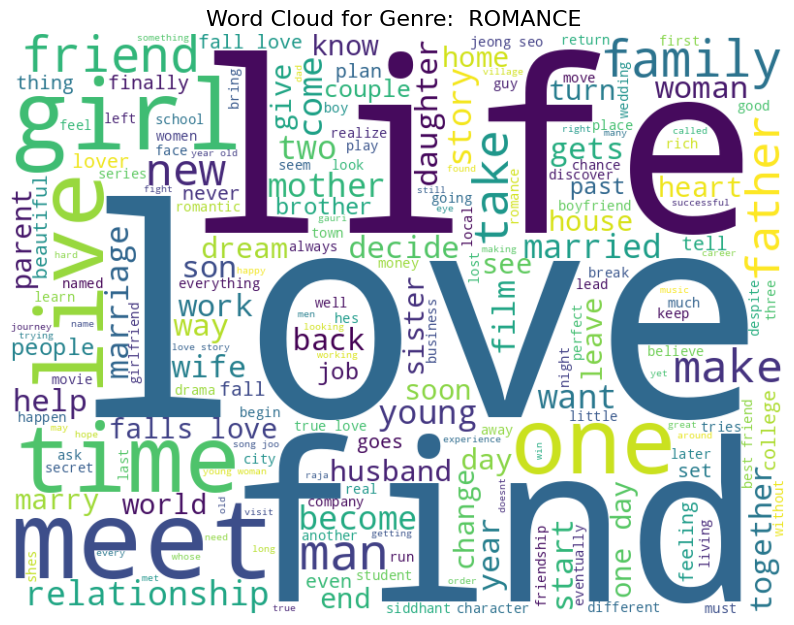

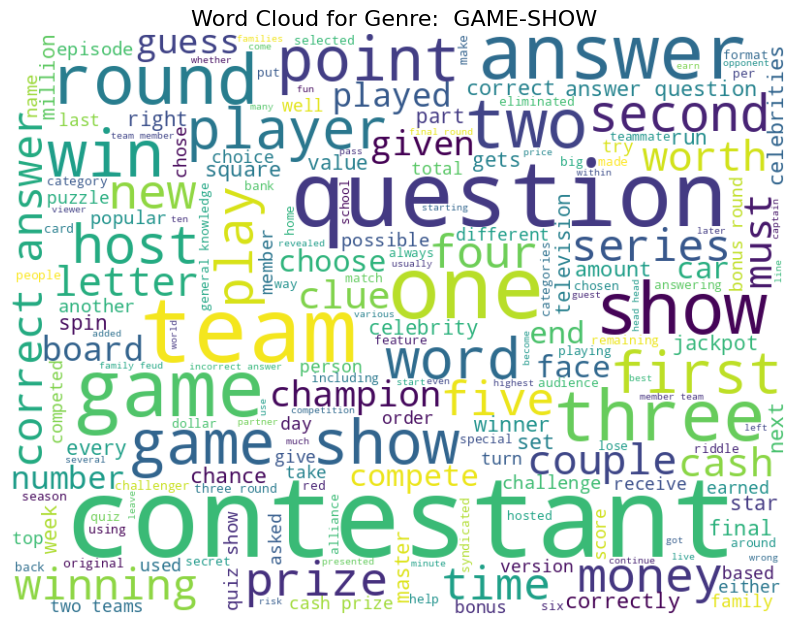

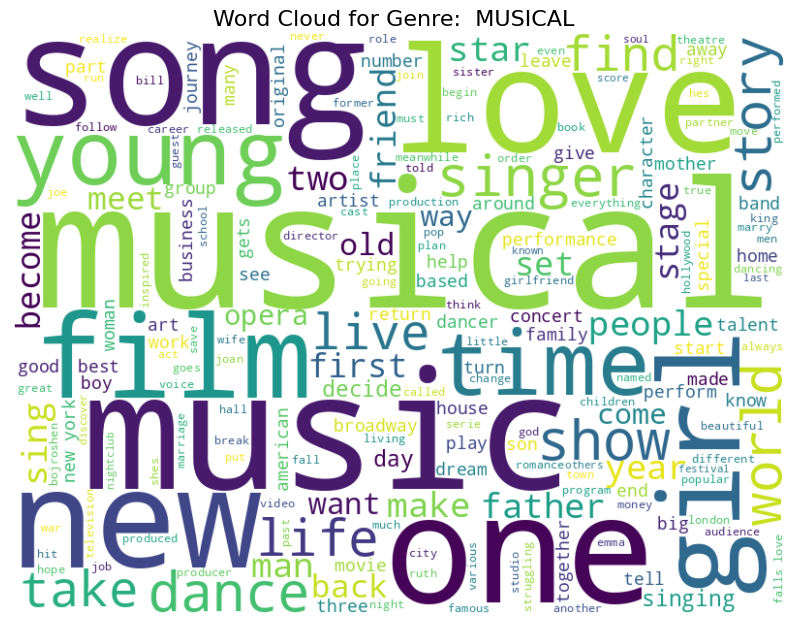

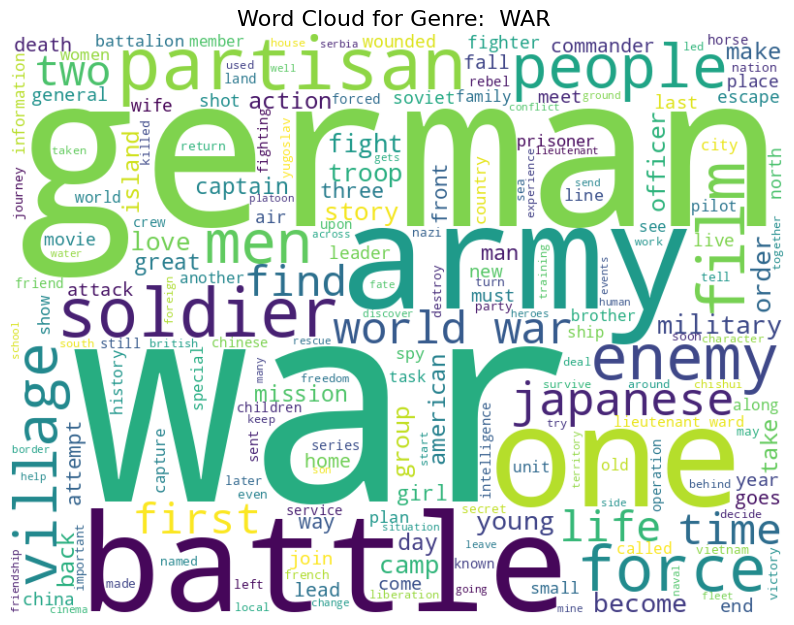

In [35]:
def generate_wordcloud(data, title):
    wordcloud = WordCloud(background_color='white', width=800, height=600).generate(' '.join(data))
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=16)
    plt.show()

for genre in train_data['Genre'].unique():
    genre_data = train_data[train_data['Genre'] == genre]['Text_cleaning']
    generate_wordcloud(genre_data, f"Word Cloud for Genre: {genre.upper()}")


Calculating Accuracy

In [38]:
test_results['Predicted_Genre_LogReg'] = y_pred_logreg
test_results['Predicted_Genre_NB'] = y_pred_nb

accuracy_logreg_test = accuracy_score(test_results['Genre'], test_results['Predicted_Genre_LogReg'])
accuracy_nb_test = accuracy_score(test_results['Genre'], test_results['Predicted_Genre_NB'])

print("Logistic Regression Test Accuracy:", accuracy_logreg_test)
print("Naive Bayes Test Accuracy:", accuracy_nb_test)

print("Classification Report for Logistic Regression:")
print(classification_report(test_results['Genre'], test_results['Predicted_Genre_LogReg']))

print("Classification Report for Naive Bayes:")
print(classification_report(test_results['Genre'], test_results['Predicted_Genre_NB']))


Logistic Regression Test Accuracy: 0.5813468634686347
Naive Bayes Test Accuracy: 0.4419557195571956
Classification Report for Logistic Regression:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


               precision    recall  f1-score   support

      action        0.52      0.22      0.31      1314
       adult        0.63      0.16      0.26       590
   adventure        0.73      0.14      0.24       775
   animation        0.67      0.01      0.02       498
   biography        0.00      0.00      0.00       264
      comedy        0.54      0.59      0.56      7446
       crime        0.57      0.02      0.03       505
 documentary        0.65      0.87      0.75     13096
       drama        0.53      0.80      0.64     13612
      family        0.56      0.06      0.10       783
     fantasy        0.00      0.00      0.00       322
   game-show        0.93      0.46      0.62       193
     history        0.00      0.00      0.00       243
      horror        0.67      0.55      0.61      2204
       music        0.68      0.36      0.47       731
     musical        1.00      0.00      0.01       276
     mystery        0.00      0.00      0.00       318
        n

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


               precision    recall  f1-score   support

      action        0.00      0.00      0.00      1314
       adult        0.00      0.00      0.00       590
   adventure        0.00      0.00      0.00       775
   animation        0.00      0.00      0.00       498
   biography        0.00      0.00      0.00       264
      comedy        0.72      0.03      0.06      7446
       crime        0.00      0.00      0.00       505
 documentary        0.53      0.89      0.67     13096
       drama        0.38      0.88      0.53     13612
      family        0.00      0.00      0.00       783
     fantasy        0.00      0.00      0.00       322
   game-show        0.00      0.00      0.00       193
     history        0.00      0.00      0.00       243
      horror        0.00      0.00      0.00      2204
       music        0.00      0.00      0.00       731
     musical        0.00      0.00      0.00       276
     mystery        0.00      0.00      0.00       318
        n

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
